In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as matplotlib
from matplotlib import animation, rc
rc('animation', html='jshtml')
from matplotlib import cm

In [2]:
### re-Defining Himmelblau function ###
def himmelblau(x):
    return np.power((np.power(x[0],2)+x[1]-11),2)+np.power((x[0]+np.power(x[1],2)-7),2)


class DownhillSimplex:
    def __init__(self, cost_func, initial_simplex, tol=0.01):

        self.cost_func       = cost_func
        self.initial_simplex = initial_simplex
        self.tol             = tol

        self.current_simplex = self.initial_simplex
        self.N_iterations    = 0
        self.history         = [[list(self.current_simplex[i]) for i in range(len(self.current_simplex))]] 
        self.simplex_x       = []
        self.simplex_y       = []


    def reflection(self):
        ## Creating list of function values of alle points in simplex ##
        func_vals = np.array([self.cost_func(self.current_simplex[i]) for i in range(len(self.current_simplex))])
        ## Finding index of point with highest function val ##
        max_index = np.argmax(func_vals)
        ## Calculating centroid ##
        centroid = np.zeros(len(self.current_simplex[0]))
        for i in range(len(self.current_simplex)):
            if i != max_index:
                #print("centroid:",centroid, "simplex[i]",simplex[i])
                centroid += self.current_simplex[i]
        centroid *= 1.0/(len(self.current_simplex)-1.0)
        ## Reflection of highest point ##
        self.current_simplex[max_index] = centroid+(centroid-self.current_simplex[max_index])
        return self.current_simplex[max_index], self.current_simplex

    def expansion(self):
        ## Creating list of function values of alle points in simplex ##
        func_vals = np.array([self.cost_func(self.current_simplex[i]) for i in range(len(self.current_simplex))])
        ## Finding index of point with highest function val ##
        max_index = np.argmax(func_vals)
        ## Calculating centroid ##
        centroid = np.zeros(len(self.current_simplex[0]))
        for i in range(len(self.current_simplex)):
            if i != max_index:
                centroid += self.current_simplex[i]
        centroid *= 1.0/(len(self.current_simplex)-1.0)    
        ## Expansion of highest point ##
        self.current_simplex[max_index] = centroid+2.0*(centroid-self.current_simplex[max_index])
        return self.current_simplex[max_index], self.current_simplex 

    ## Defining a function for doing a contraction of highest point ##   
    def contraction(self):
        ## Creating list of function values of alle points in simplex ##
        func_vals = np.array([self.cost_func(self.current_simplex[i]) for i in range(len(self.current_simplex))])
        ## Finding index of point with highest function val ##
        max_index = np.argmax(func_vals)
        ## Calculating centroid ##
        centroid = np.zeros(len(self.current_simplex[0]))
        for i in range(len(self.current_simplex)):
            if i != max_index:
                centroid += self.current_simplex[i]
        centroid *= 1.0/(len(self.current_simplex)-1.0)    
        ## Expansion of highest point ##
        self.current_simplex[max_index] = centroid+0.5*(self.current_simplex[max_index]-centroid)
        return self.current_simplex[max_index], self.current_simplex 

    ## Defining a function for doing a reduction of alle points except lowest ##   
    def reduction(self):
        ## Creating list of function values of alle points in simplex ##
        func_vals = np.array([self.cost_func(self.current_simplex[i]) for i in range(len(self.current_simplex))])
        ## Finding index of point with lowest function val ##
        min_index = np.argmin(func_vals)
        ## reduction of all points except lowest ##
        for i in range(len(self.current_simplex)):
            if i != min_index:
                self.current_simplex[i] = 0.5*(self.current_simplex[i]+self.current_simplex[min_index])
        return self.current_simplex 

    ## Defining a function for calculating the size of the simplex ##
    def simplex_size(self):
        # Calculting distances between points in simplex #
        distances = []
        for i in range(len(self.current_simplex)):
            for j in range(len(self.current_simplex)):
                if i < j:
                    distances.append(np.linalg.norm(self.current_simplex[i]-self.current_simplex[j]))
        return np.sum(distances)

    def simulate(self):
        while self.simplex_size() >= self.tol:
            ## Creating list of function values of alle points in simplex ##
            func_vals = np.array([self.cost_func(self.current_simplex[i]) for i in range(len(self.current_simplex))])
            ## Trying reflection ##
            reflected_point, reflected_simplex = self.reflection()
            if self.cost_func(reflected_point) < np.min(func_vals):
                ## Trying expansion ##
                expanded_point, expanded_simplex = self.expansion()
                if self.cost_func(expanded_point) < self.cost_func(reflected_point):
                    ## Accepting expansion ##
                    self.current_simplex=expanded_simplex
                else:
                    ## Accepting reflection ##
                    self.current_simplex=reflected_simplex
            else:
                if self.cost_func(reflected_point) < np.max(func_vals):
                    ## Accepting reflection ##
                    self.current_simplex=reflected_simplex
                else:
                    ## Trying contraction ##
                    contracted_point, contracted_simplex = self.contraction()
                    if self.cost_func(contracted_point) < np.max(func_vals):
                        ## Accepting contraction ##
                        self.current_simplex=contracted_simplex
                    else:
                        ## computing reduction of simplex ##
                        self.current_simplex=self.reduction()
                        
            ## Saving current step and incrementing counter ##
            temp = [list(self.current_simplex[i]) for i in range(len(self.current_simplex))]
            self.history.append(temp)
            self.N_iterations += 1
    
    def convert_history(self):
        for i in range(len(self.history)):
            temp_x, temp_y  = [], []
            for j in range(len(self.history[i])):
                temp_x.append(self.history[i][j][0])
                temp_y.append(self.history[i][j][1])
            temp_x.append(self.history[i][0][0])
            temp_y.append(self.history[i][0][1])
            self.simplex_x.append(temp_x), self.simplex_y.append(temp_y)
        


nr of steps =  50
final simplex = [[-2.8029912633319327, 3.1311944781118655], [-2.80446509104695, 3.1301530435266613], [-2.807116533494991, 3.131191313157615]]


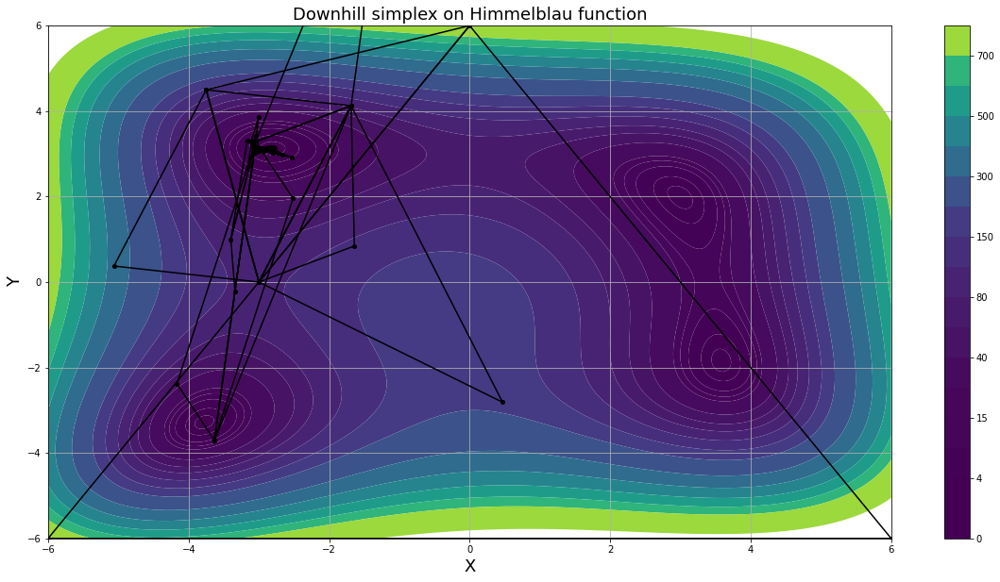

In [3]:
                    ###############################################################################
                    #################### Creating Contour plot of function ########################
                    ###############################################################################
            
## Defining x- & y-limits for plot ##
xlims, ylims = [-6.0,6.0], [-6.0,6.0]

## Determining levels in function: i.e. Z = 0, 1, 4, 10.... ##
levels = [0,1,4,10,15,20,40,60,80,110,150,200,300,400,500,600,700,1000]

## Setting values for  contourplot ##
xlist = np.linspace(xlims[0],xlims[1],1000)
ylist = np.linspace(ylims[0],ylims[1],1000)
X, Y = np.meshgrid(xlist,ylist)
Z = np.power((np.power(X,2)+Y-11),2)+np.power((X+np.power(Y,2)-7),2)


## Computing simplex algorithm ##
simplex_init = [np.array([-6.0,-6.0]),np.array([0.0,6.0]),np.array([6.0,-6.0])]
test = DownhillSimplex(cost_func=himmelblau, initial_simplex=simplex_init, tol = 0.01)
test.simulate()
test.convert_history()
simplex_x, simplex_y = test.simplex_x, test.simplex_y
nr_steps, simplex_steps = test.N_iterations, test.history
print("nr of steps = ",nr_steps)
print("final simplex =", simplex_steps[-1])



## Defining plot ##
fig, ax = plt.subplots(1,1,figsize = (20,10))
ax.set_title('Downhill simplex on Himmelblau function',size=18)
contour_plot = ax.contourf(X,Y,Z, levels, antialiased=True,cmap=cm.viridis)
fig.colorbar(contour_plot)
ax.set_xlim(xlims[0],xlims[1]), ax.set_ylim(ylims[0],ylims[1])
ax.set_xlabel("X",size=18), ax.set_ylabel("Y",size=18)
ax.grid()
## Plotting simplex steps ##
counter = 0
for i in range(len(simplex_steps)):
    for j in range(len(simplex_steps[i])):
        ax.plot(simplex_steps[i][j][0],simplex_steps[i][j][1],'ko',ms=4)
    ax.plot(simplex_x[i],simplex_y[i],color='k')
    ## Uncomment below to save images ##
    #plt.savefig("Images/figure"+str(i)+".jpg", dpi = 100, pil_kwargs={"quality": 95,"optimize":True}, format = "jpg")
plt.show()

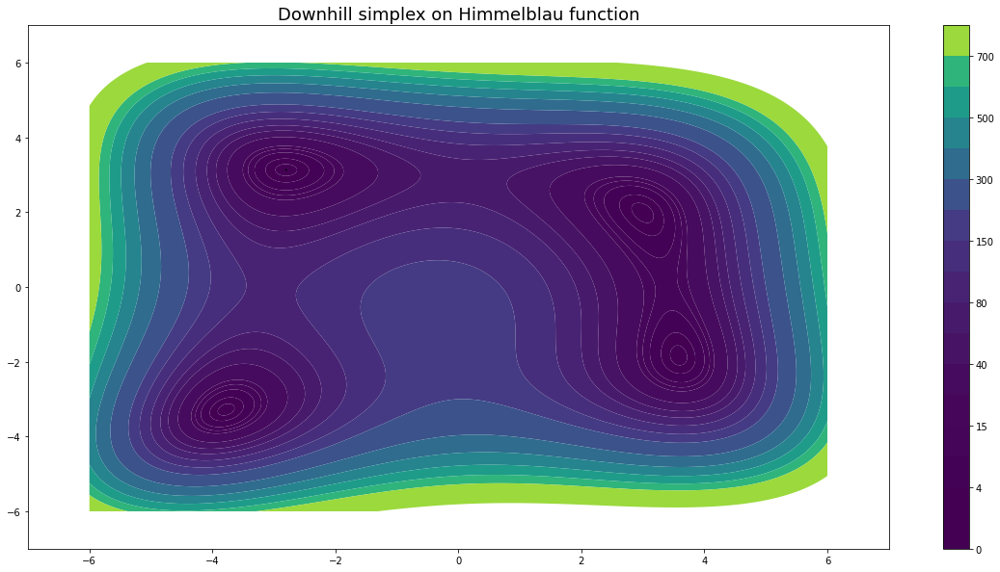

In [4]:

## Defining plot ##
fig, ax = plt.subplots(1,1,figsize = (20,10))
ax.set_title('Downhill simplex on Himmelblau function',size=18)
contour_plot = ax.contourf(X,Y,Z, levels, antialiased=True,cmap=cm.viridis)
fig.colorbar(contour_plot)

lines, = ax.plot([],[],color='k')


def update(i):
    lines.set_data(simplex_x[i],simplex_y[i])

    return lines,


ax.set_xlim(-7,7)
ax.set_ylim(-7,7)
anim = animation.FuncAnimation(fig,
                               update,
                               frames=len(simplex_x),
                               interval=300,
                               blit=True,
                               repeat_delay=0)
# Set up formatting for the movie files

## uncomment below to save gif ##
writergif = animation.PillowWriter(fps=5) 
anim.save("anim4.gif", writer=writergif)

anim